# Segundo Modelo GAN

## Imports y descarga del dataset

Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random


from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv2D,Conv3D,Conv2DTranspose, Dense, Activation, Flatten, Reshape, Dropout, UpSampling2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.optimizers import Adam
from keras.layers import Input, concatenate
from tensorflow.keras.layers import Cropping2D
from google.colab import files
import os
import json
from tensorflow.keras import layers


Obtención de imagene de Kaggle

In [ ]:

uploaded = files.upload()


# Configurar las credenciales de Kaggle
with open('kaggle.json') as f:
    kaggle_credentials = json.load(f)


os.environ['KAGGLE_USERNAME'] = kaggle_credentials['username']
os.environ['KAGGLE_KEY'] = kaggle_credentials['key']


# Descargar el conjunto de datos (reemplaza 'nombre_del_conjunto_de_datos' y 'nombre_del_usuario' con tu información)
!kaggle datasets download -d arnaud58/landscape-pictures
# Descomprimir el archivo descargado
!unzip landscape-pictures.zip -d ImagenesOriginales

Saving kaggle.json to kaggle.json
 99% 617M/620M [00:29<00:00, 23.6MB/s]
100% 620M/620M [00:29<00:00, 22.3MB/s]
Archive:  landscape-pictures.zip
  inflating: ImagenesOriginales/00000000.jpg  
  inflating: ImagenesOriginales/00000000_(2).jpg  
  inflating: ImagenesOriginales/00000000_(3).jpg  
  inflating: ImagenesOriginales/00000000_(4).jpg  
  inflating: ImagenesOriginales/00000000_(5).jpg  
  inflating: ImagenesOriginales/00000000_(6).jpg  
  inflating: ImagenesOriginales/00000000_(7).jpg  
  inflating: ImagenesOriginales/00000001.jpg  
  inflating: ImagenesOriginales/00000001_(2).jpg  
  inflating: ImagenesOriginales/00000001_(3).jpg  
  inflating: ImagenesOriginales/00000001_(4).jpg  
  inflating: ImagenesOriginales/00000001_(5).jpg  
  inflating: ImagenesOriginales/00000001_(6).jpg  
  inflating: ImagenesOriginales/00000001_(7).jpg  
  inflating: ImagenesOriginales/00000002.jpg  
  inflating: ImagenesOriginales/00000002_(2).jpg  
  inflating: ImagenesOriginales/00000002_(3).jpg  


## Tratado de Imagenes

Similar al anterior, la única diferencia es que solo guarda cuando descomprime en la ruta '/content/ImagenesOriginales'. Crea un array vacío llamado 'imagenes', en el cual se van añadiendo una a una las imágenes redimensionadas. Además, se cambian los canales a RGB.

In [ ]:
import os
import cv2
import numpy as np

# Ruta del directorio que contiene las imágenes
directorio_imagenes = '/content/ImagenesOriginales'

# Obtener la lista de archivos en el directorio
archivos = os.listdir(directorio_imagenes)

# Directorio de salida para las imágenes de baja calidad
directorio_salida = 'imagenesRedimensionadas'


# Redimensionar la imagen a 128x128 píxeles
nuevo_tamano = (128, 128)
imagenes = []
# Reducir la calidad de las imágenes y guardarlas en el nuevo directorio
for archivo in archivos:
    # Verificar si es un archivo de imagen
    if archivo.endswith('.jpg') or archivo.endswith('.png'):
        # Cargar la imagen
        imagen_path = os.path.join(directorio_imagenes, archivo)
        imagen = cv2.imread(imagen_path)
        imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
        imagen_redimensionada = cv2.resize(imagen_rgb, nuevo_tamano)

        imagenes.append(imagen_redimensionada)






### Xtrain

La línea 'X_train_Reales = np.array(imagenes)' se encarga de convertir el array 'imagenes', que contiene imágenes previamente redimensionadas y con canales cambiados a RGB, en un arreglo de tipo numpy llamado 'X_train_Reales'. Este paso es esencial para preparar los datos de entrenamiento de un modelo, ya que muchos algoritmos de aprendizaje automático requieren que los datos de entrada estén en forma de matrices o arreglos para su procesamiento eficiente.

Forma de X_train_Reales:  (4319, 128, 128, 3)


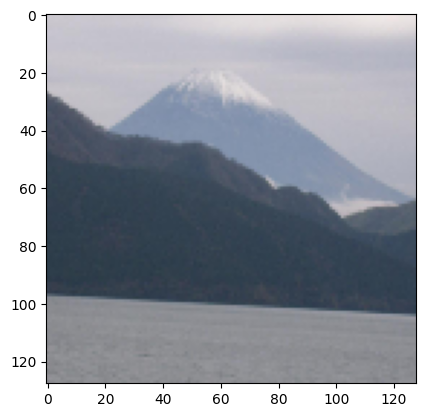

In [ ]:
# Convertir la lista a un array de numpy
X_train_Reales = np.array(imagenes)


# Imprimir la forma del conjunto
print("Forma de X_train_Reales: ", X_train_Reales.shape)

plt.imshow(X_train_Reales[7])

La instrucción 'X_train_Reales = X_train_Reales.astype('float32')/(255/2)-1' realiza dos operaciones clave en el conjunto de datos de entrenamiento 'X_train_Reales'. Primero, convierte todos los elementos del arreglo a tipo de dato float32, lo cual es común en el preprocesamiento de datos para modelos de aprendizaje automático. Luego, normaliza los valores de píxeles al escalarlos en el rango de -1 a 1, dividiendo cada valor por la mitad de 255 (255/2). Esta normalización es crucial para mejorar la estabilidad y eficiencia del entrenamiento de modelos, permitiendo que los algoritmos converjan de manera más efectiva.

In [ ]:

X_train_Reales = X_train_Reales.astype('float32')/(255/2)-1


## Train y funciones de plot

Train, cuenta con: generación de ruido (batch_size, 128, 128, 3), crop_imagenes porción de tamaño batch_size del x_train que servirá como base para imagenes_vacias, imagenes_vacias, array vacío de tamaño (0, 128, 128, 3) en el cual se irán añadiendo las imágenes de crop_imagenes que se van procesando.

Se procesan de la siguiente manera:

imagenA[64:, :64, :] = imagen_negra[64:, :64, :]:

En esta línea, se copian los píxeles de la parte inferior derecha de imagen_negra a la parte inferior izquierda de imagenA. Se asume que ambas imágenes tienen al menos 64 píxeles de altura y 64 píxeles de ancho.

imagenA[64:, 64:, :] = imagen_negra[64:, 64:, :]:

Aquí, se copian los píxeles de la parte inferior derecha de imagen_negra a la parte inferior derecha de imagenA. Nuevamente, se supone que ambas imágenes tienen al menos 64 píxeles de altura y 64 píxeles de ancho.

imagenA[:64, 64:, :] = imagen_negra[:64, 64:, :]:

En esta línea, se copian los píxeles de la parte superior derecha de imagen_negra a la parte superior derecha de imagenA. Igualmente, se asume que ambas imágenes tienen al menos 64 píxeles de altura y 64 píxeles de ancho.

In [ ]:
def train(x_train, generator, discriminator, combined, epochs, batch_size=32, sample_interval=100):
    # Adversarial ground truths (-1 fake and 1 real)
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    history = {
        'd_loss' : [],
        'd_acc' : [],
        'g_loss' : []
    }

    for epoch in range(epochs):
        print("----EPOCH " + str(epoch) + '-----')
        for batch in range(int(len(x_train)/batch_size)):


            #  Train the Discriminator


            # Seleccionar las imágenes correspondientes a los índices

            new_shape = (batch_size,128, 128, 3)

            # Genera el array con la nueva forma
            noise = np.random.normal(0, 1, new_shape)


            cropImgs = x_train[batch * batch_size : (batch + 1) * batch_size]


            imagenes_vacias = np.empty((0, 128, 128, 3), dtype=np.uint8)

            # Copia la esquina de la imagen original en la nueva imagen
            for i in range(batch_size):
              imagenA = np.copy(cropImgs[i])

              imagen_negra = np.zeros((128, 128, 3), dtype=np.uint8)

              imagenA[64:, :64, :] = imagen_negra[64:, :64, :]
              imagenA[64:, 64:, :] = imagen_negra[64:, 64:, :]
              imagenA[:64, 64:, :] = imagen_negra[:64, 64:, :]
              imagenes_vacias = np.append(imagenes_vacias, imagenA[np.newaxis, :], axis=0)


            # Metemos las imagenes de entrada aleatorias de input al generador, para obtener la prediccion

            gen_imgs = generator.predict([imagenes_vacias,noise], verbose=0)

             # Definir el número de imágenes a pasar al discriminador (REALES)
            imgs = x_train[batch*batch_size : (batch+1)*batch_size]

            d_loss_real = discriminator.train_on_batch(imgs, valid)
            d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train the Generator
              # Volvemos a seleccionar un conjunto aleatorio de X_train


            g_loss = combined.train_on_batch([imagenes_vacias,noise], valid)

            # Save losses
            history['d_loss'].append(d_loss[0])
            history['d_acc'].append(d_loss[1])
            history['g_loss'].append(g_loss)

            # Plot the progress
            if batch % 50 == 0:
                print ("%d [D loss: %.4f,\t acc.: %.2f%%]\t[G loss: %.4f]" % (batch, d_loss[0], 100*d_loss[1], g_loss))

            if batch % 250 == 0:
                sample_images(epoch, batch, gen_imgs, imgs)

        plot_losses(history)


### Funciones Ploteo

Función de ploteo especial para imágenes RGB con valores de píxeles entre -1 y 1.

In [ ]:
def sample_images(epoch, batch, gen_imgs, imgs):
    plt.rcParams['figure.figsize'] = [15, 5]
    fig, axs = plt.subplots(2, 5)
    fig.suptitle('Epoch: ' + str(epoch) + ', Batch: ' + str(batch), fontsize=16)
    for i in range(5):
        axs[0, i].imshow(0.5 * gen_imgs[i] + 0.5, cmap='gray')
        axs[0, i].axis('off')

    for i in range(5):
        axs[1, i].imshow(0.5 * imgs[i] + 0.5, cmap='gray')
        axs[1, i].axis('off')

    plt.show()
    plt.close()

In [ ]:
def plot_losses(history):
    plt.rcParams['figure.figsize'] = [20, 5]
    f, (ax1, ax2) = plt.subplots(1, 2, sharex=True)

    ax1.set_title('Losses')
    ax1.set_xlabel('epoch')
    ax1.legend(loc="upper right")
    ax1.grid()

    ax1.plot(history['d_loss'], label='D loss')
    ax1.plot(history['g_loss'], label='G loss')
    ax1.legend()

    ax2.set_title('D accuracy')
    ax2.set_xlabel('epoch')
    ax2.legend(loc="upper right")
    ax2.grid()

    ax2.plot(history['d_acc'], label='Accuracy')
    ax2.legend()

    plt.show()


## Generador GAN 2

Ahora, el generador cuenta con un input adicional para el ruido. El ruido tiene una forma de (128, 128, 3), de tal manera que, al concatenarse con la imagen de entrada original (128, 128, 3) en la dimensión 3, quedará con una forma de (128, 128, 6). Esto nos permite trabajar cómodamente con este formato de capas.

De la misma manera que en los generadores anteriores, forzamos artificialmente que la salida de este cuente con la esquina superior izquierda original.

In [ ]:
from tensorflow.keras.layers import Input, Dense, LeakyReLU, Concatenate

def create_generator2():
    input = Input(shape=(128,128,3))
    input_shape = (128, 128, 3)
    input_ruido = Input(shape=(128,128,3))

    concatenated = Concatenate(axis=3)([input_ruido, input])

    x = Conv2D(64, kernel_size=3, strides=1, padding='same', input_shape=input_shape)(concatenated)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(64, kernel_size=3, strides=1, padding='same', input_shape=input_shape)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv2D(64, kernel_size=3, strides=1, padding='same', input_shape=input_shape)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Capa de convolución 2
    x = Conv2D(128, kernel_size=3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Capa de convolución 3
    x = Conv2D(256, kernel_size=3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Capa de convolución 3
    x = Conv2D(256, kernel_size=3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Capa de convolución 3
    x = Conv2D(256, kernel_size=3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)


    # Capa de salida
    x = Conv2D(3, kernel_size=3, strides=1, padding='same', activation='tanh')(x)


    input_layer_x = input

    input_layer_y = x
    input_shape=(128, 128, 3)
    # Dividir x en la mitad izquierda
    x_izquierda = input_layer_x[:, :int(input_shape[1] / 2), :]

    # Dividir y en la mitad derecha
    y_derecha = input_layer_y[:, int(input_shape[1] / 2):, :]

    # Concatenar las mitades izquierda y derecha
    output = Concatenate(axis=1)([x_izquierda, y_derecha])

     # Dividir x en la mitad izquierda
    x_izquierda = output[:, :, :int(input_shape[1] / 2)]

    # Dividir y en la mitad derecha
    y_derecha = input_layer_y[:, :, int(input_shape[1] / 2):]

    # Concatenar las mitades izquierda y derecha
    output = Concatenate(axis=2)([x_izquierda, y_derecha])




    generator = Model(inputs=[input, input_ruido], outputs=output)

    return generator

(None, 128, 128, 6)


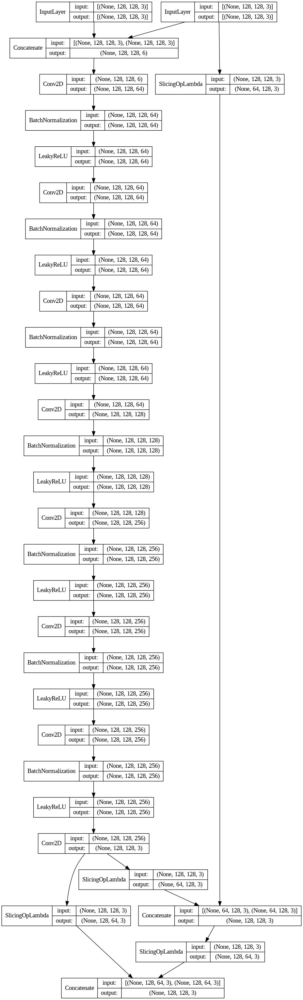

In [ ]:
generator2 = create_generator2()
plot_model(generator2, show_shapes=True, show_layer_names=False)

## Discriminador GAN 2

Discriminador equivalente a los anteriores.

In [ ]:
def create_discriminatorConvu2():
    input = Input(shape=(128, 128, 3))

    x= Conv2D(32, kernel_size=3, padding="same", activation="relu")(input)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.25)(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x= Conv2D(16, kernel_size=3, padding="same", activation="relu")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.25)(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x= Conv2D(8, kernel_size=3, padding="same", activation="relu")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.25)(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x= Conv2D(4, kernel_size=3, padding="same", activation="relu")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.25)(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x= Conv2D(1, kernel_size=3, padding="same", activation="relu")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.25)(x)

    x = Flatten()(x)
    x = Dense(49, activation = 'LeakyReLU')(x)

    x = Dense(21, activation = 'LeakyReLU')(x)
    output = Dense(1, activation = 'sigmoid')(x)

    discriminator = Model(input, output)

    return discriminator

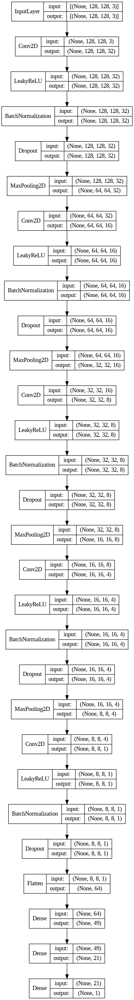

In [ ]:
discriminatorConvu2 = create_discriminatorConvu2()
plot_model(discriminatorConvu2, show_shapes=True, show_layer_names=False)

## Combinado

Combinado, teniendo en cuenta la nueva entrada de ruido tanto para el combinado como para el propio generador.

In [ ]:
discriminatorConvu2.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
discriminatorConvu2.trainable = False


ruido = Input(shape=(128,128,3))


z = Input(shape=(128,128,3))
img_generated = generator2([z, ruido])

validity = discriminatorConvu2(img_generated)

combinedConvu2 = Model([z, ruido], validity)
combinedConvu2.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.002))

## Entrenamiento GAN 2

----EPOCH 0-----
0 [D loss: 6.4251,	 acc.: 50.00%]	[G loss: 0.0003]


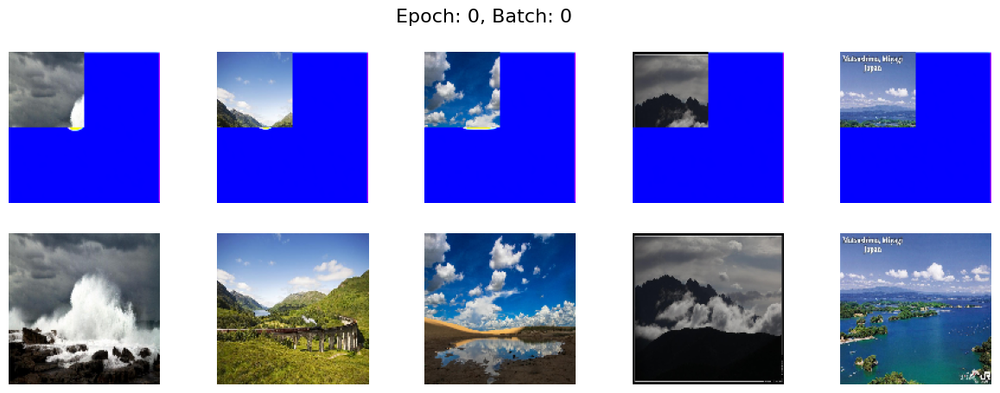

50 [D loss: 7.2954,	 acc.: 50.00%]	[G loss: 0.0001]
100 [D loss: 7.0596,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 6.6985,	 acc.: 56.25%]	[G loss: 0.0000]
200 [D loss: 7.1057,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 3.7947,	 acc.: 56.25%]	[G loss: 0.0001]


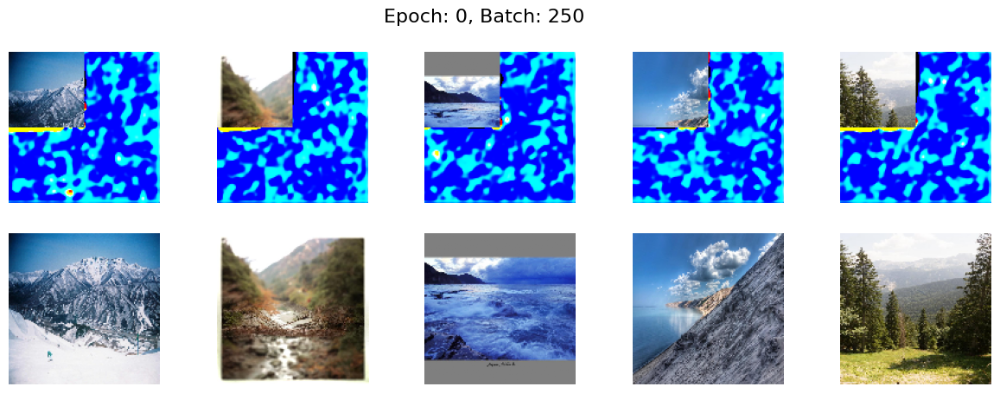

300 [D loss: 3.3834,	 acc.: 50.00%]	[G loss: 0.0001]
350 [D loss: 4.6100,	 acc.: 50.00%]	[G loss: 0.0001]
400 [D loss: 6.8735,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 6.3649,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 6.7973,	 acc.: 50.00%]	[G loss: 0.0000]


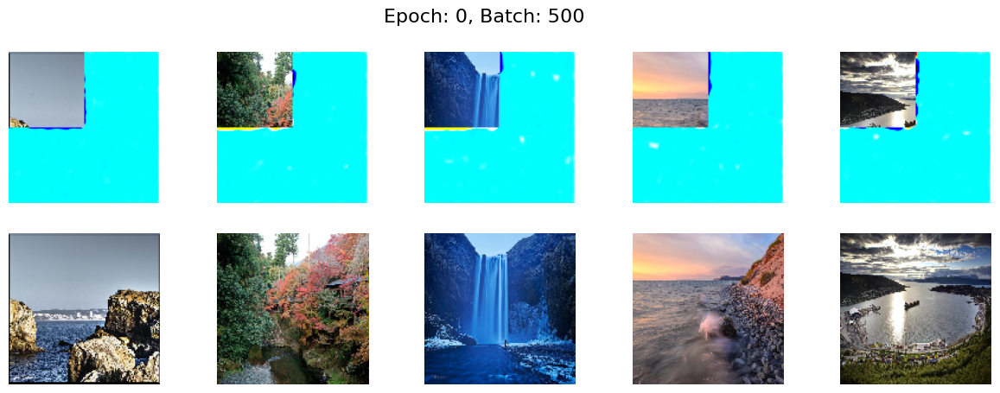

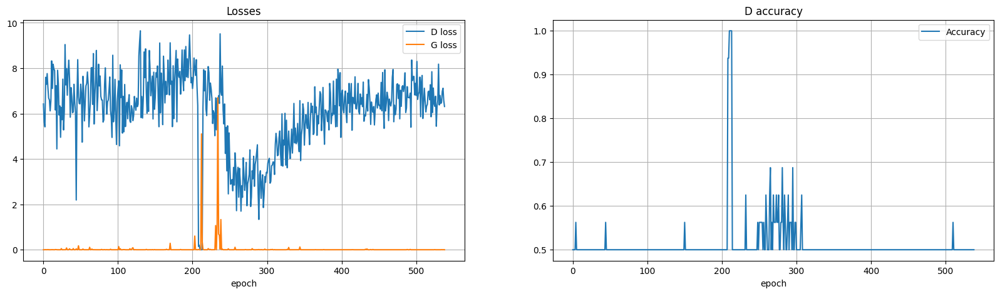

----EPOCH 1-----
0 [D loss: 6.6487,	 acc.: 50.00%]	[G loss: 0.0000]


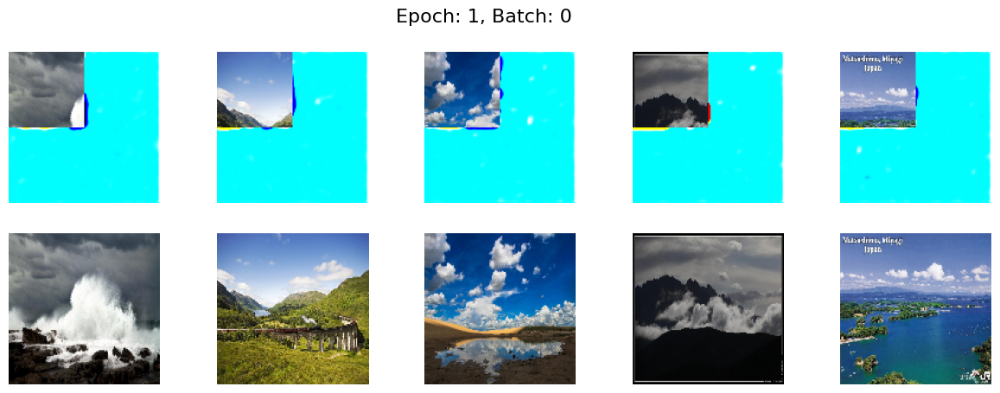

50 [D loss: 6.3117,	 acc.: 50.00%]	[G loss: 0.0000]
100 [D loss: 6.5351,	 acc.: 50.00%]	[G loss: 0.0001]
150 [D loss: 8.0470,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 7.6393,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.1237,	 acc.: 50.00%]	[G loss: 0.0000]


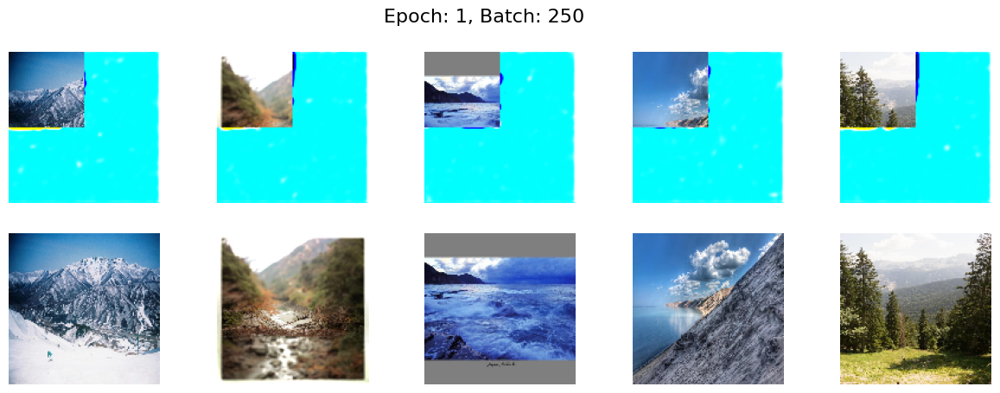

300 [D loss: 7.0899,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 7.7400,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 7.0307,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 7.6200,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 7.9465,	 acc.: 50.00%]	[G loss: 0.0013]


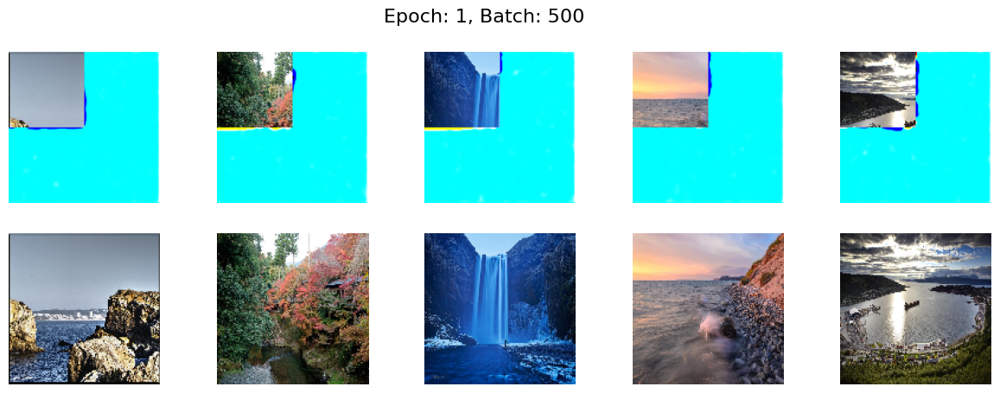

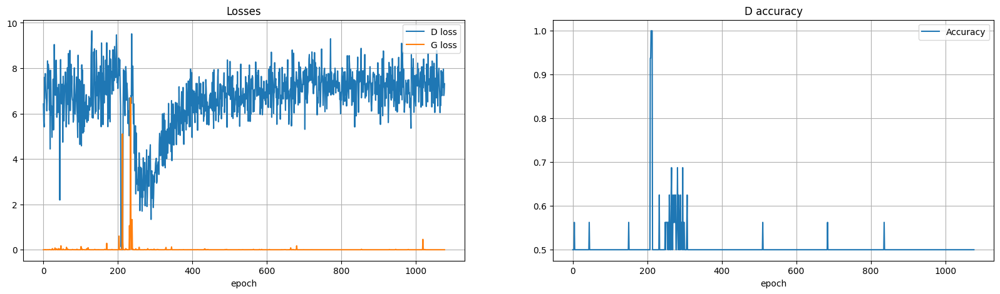

----EPOCH 2-----
0 [D loss: 8.0439,	 acc.: 50.00%]	[G loss: 0.0002]


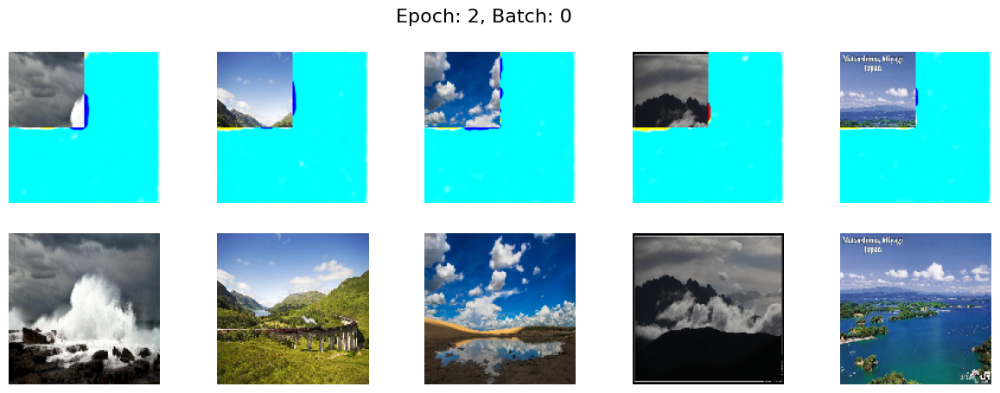

50 [D loss: 7.0238,	 acc.: 50.00%]	[G loss: 0.0018]
100 [D loss: 6.1861,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 8.4011,	 acc.: 50.00%]	[G loss: 0.0002]
200 [D loss: 7.7145,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.4737,	 acc.: 50.00%]	[G loss: 0.0001]


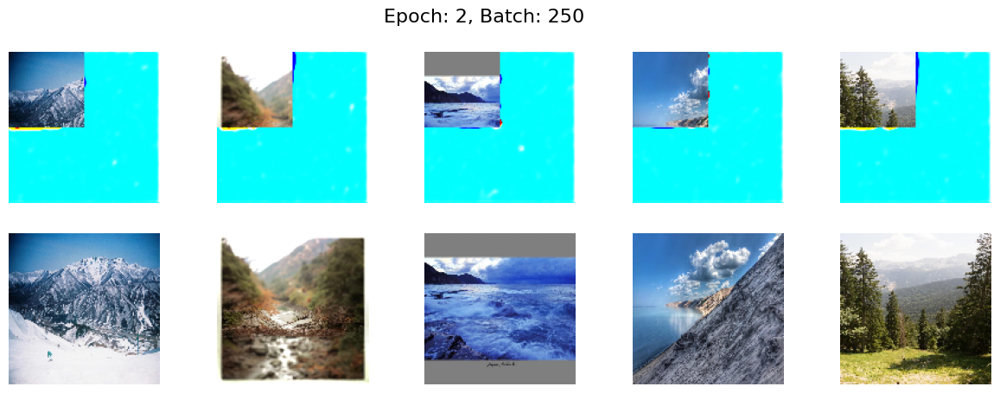

300 [D loss: 6.4365,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 7.6294,	 acc.: 50.00%]	[G loss: 0.0001]
400 [D loss: 7.6425,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 7.3501,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 8.4936,	 acc.: 50.00%]	[G loss: 0.0000]


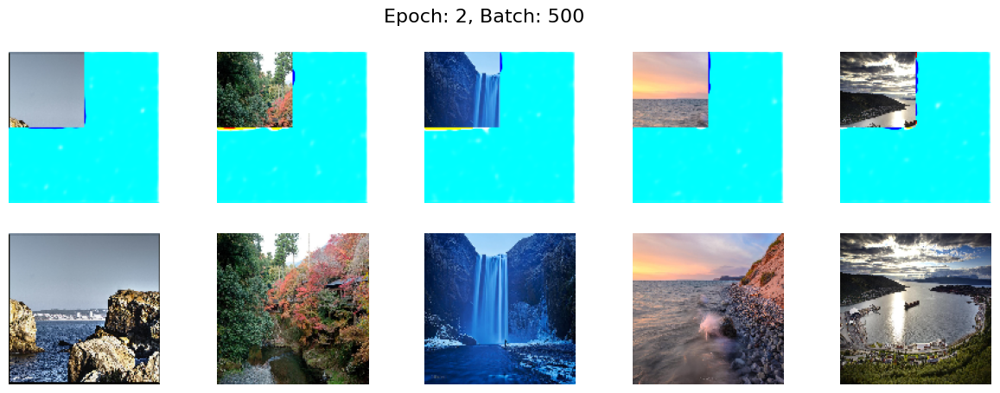

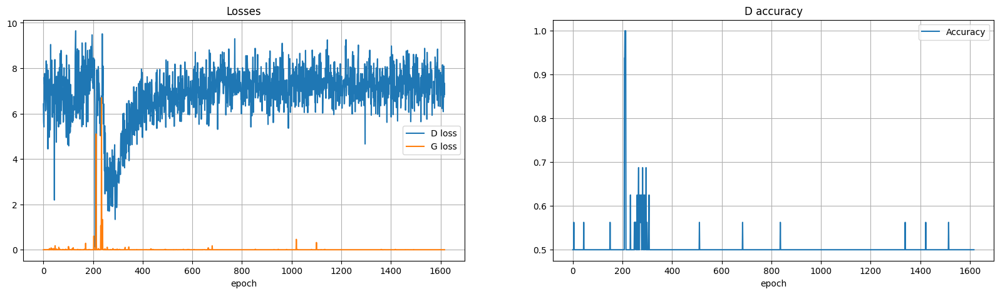

----EPOCH 3-----
0 [D loss: 7.2948,	 acc.: 50.00%]	[G loss: 0.0000]


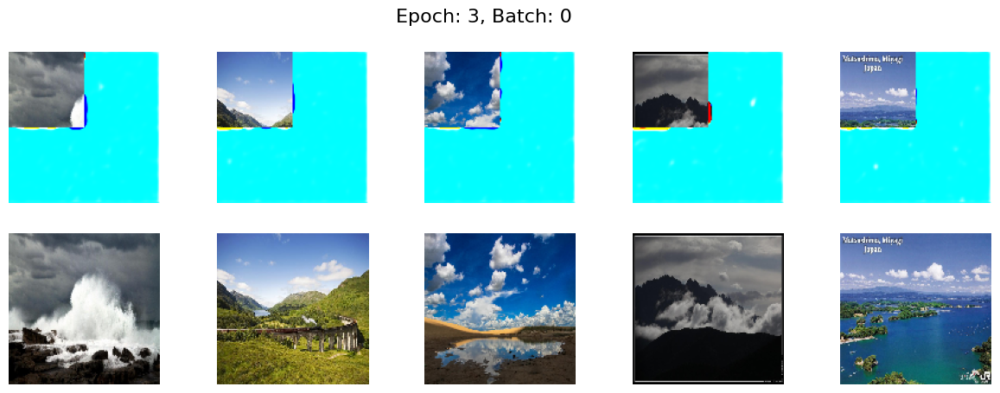

50 [D loss: 8.2077,	 acc.: 50.00%]	[G loss: 0.0001]
100 [D loss: 5.9885,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 7.9982,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 7.4783,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.9013,	 acc.: 50.00%]	[G loss: 0.0000]


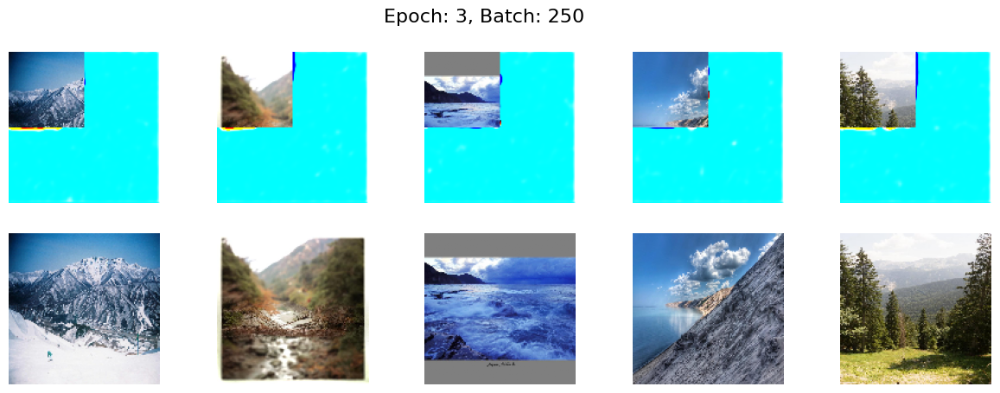

300 [D loss: 6.1447,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 7.2957,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 7.8214,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 8.3153,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 6.4369,	 acc.: 50.00%]	[G loss: 0.0000]


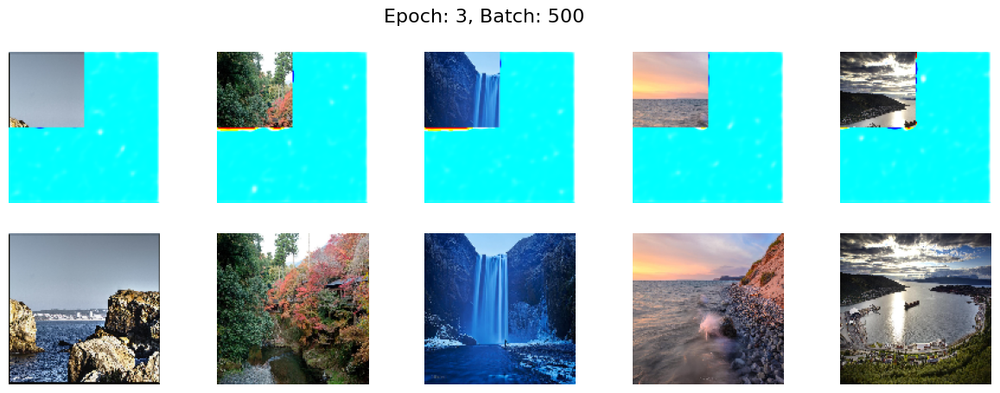

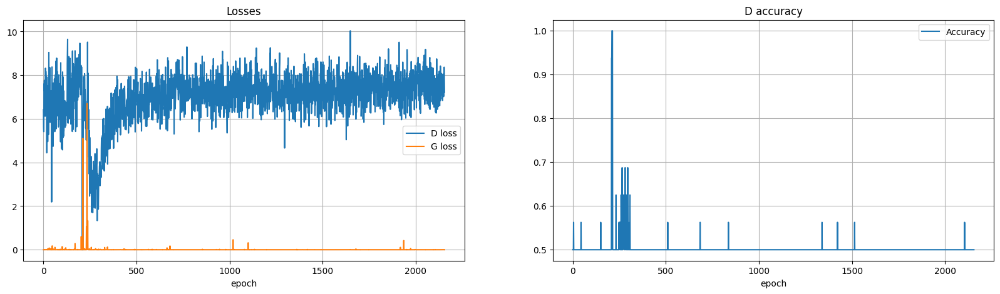

----EPOCH 4-----
0 [D loss: 8.0833,	 acc.: 50.00%]	[G loss: 0.0000]


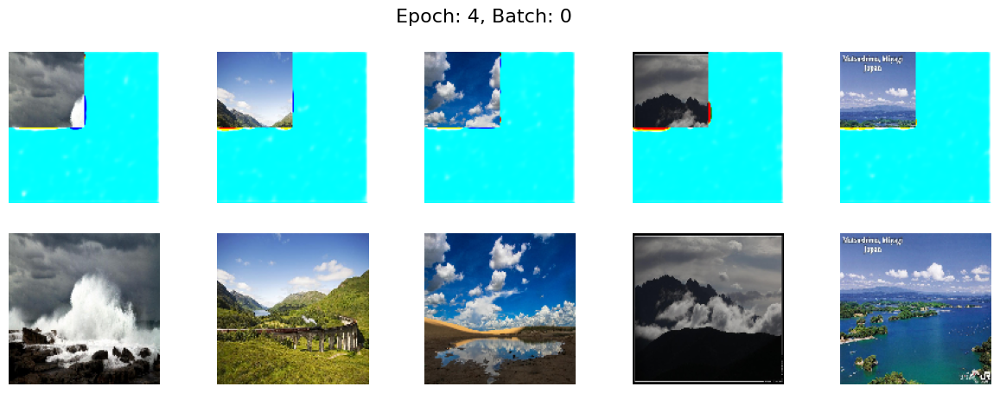

50 [D loss: 7.0953,	 acc.: 50.00%]	[G loss: 0.0000]
100 [D loss: 7.6423,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 7.9933,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 6.3940,	 acc.: 50.00%]	[G loss: 0.0001]
250 [D loss: 8.0971,	 acc.: 50.00%]	[G loss: 0.0000]


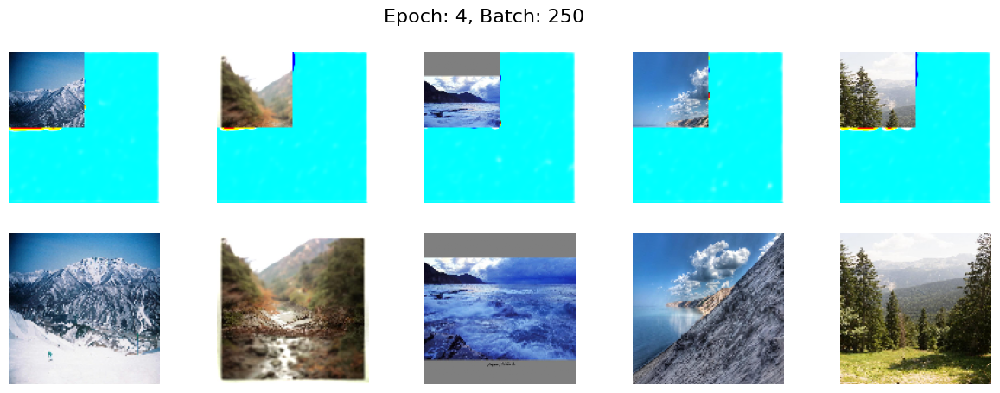

300 [D loss: 7.2338,	 acc.: 50.00%]	[G loss: 0.0001]
350 [D loss: 8.3639,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 9.7125,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 8.2184,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 7.8186,	 acc.: 50.00%]	[G loss: 0.0000]


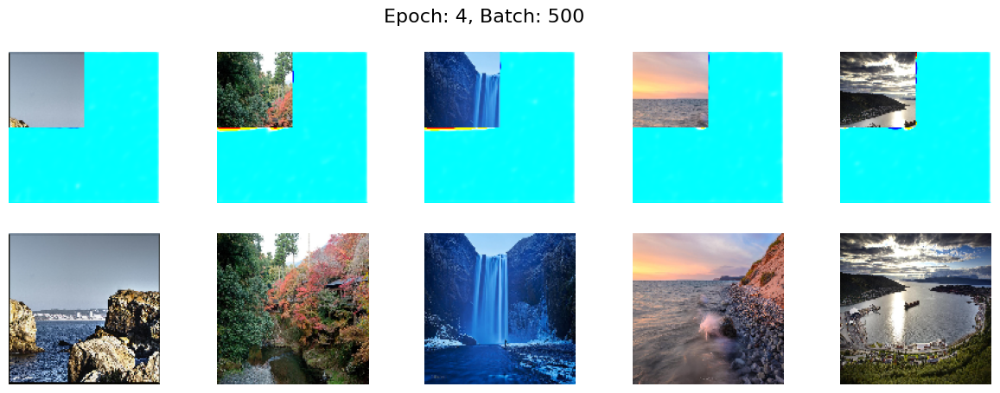

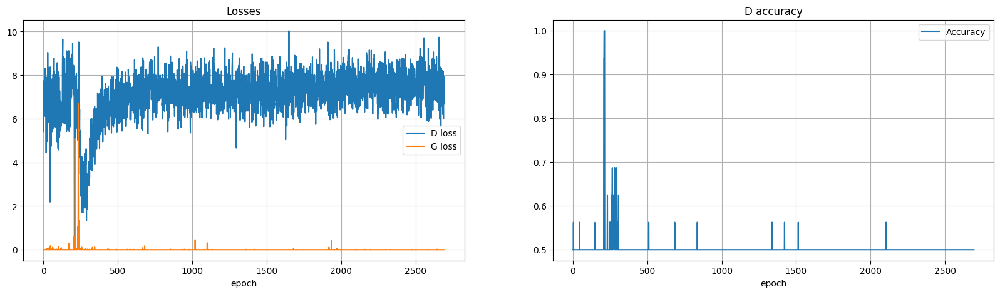

----EPOCH 5-----
0 [D loss: 7.8011,	 acc.: 50.00%]	[G loss: 0.0000]


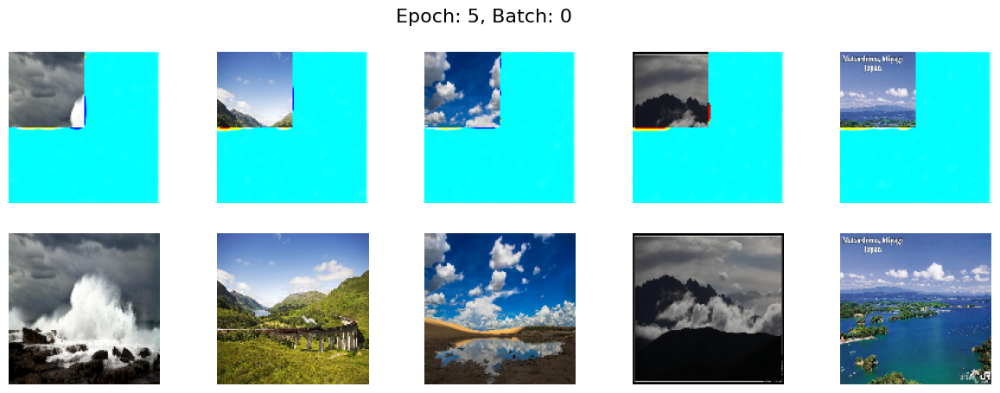

50 [D loss: 7.9364,	 acc.: 50.00%]	[G loss: 0.0000]
100 [D loss: 7.1394,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 8.8019,	 acc.: 50.00%]	[G loss: 0.0006]
200 [D loss: 7.6864,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.7898,	 acc.: 50.00%]	[G loss: 0.0000]


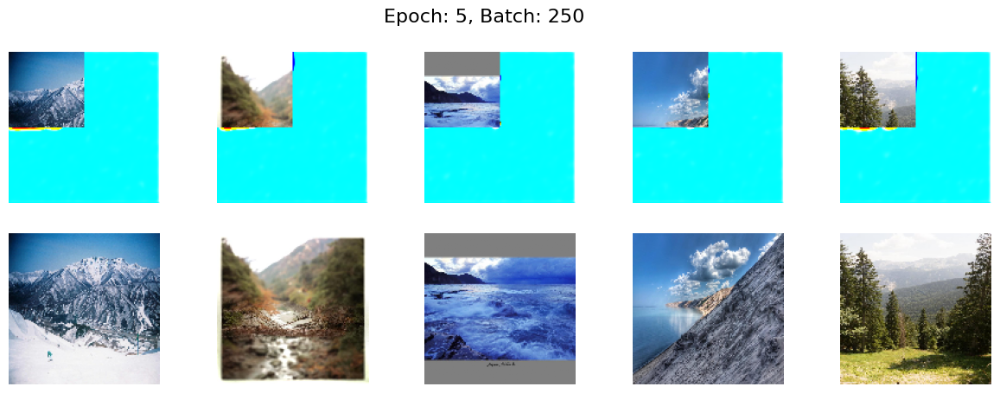

300 [D loss: 6.2326,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 7.7047,	 acc.: 50.00%]	[G loss: 0.0003]
400 [D loss: 8.3200,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 7.9579,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 7.3797,	 acc.: 50.00%]	[G loss: 0.0000]


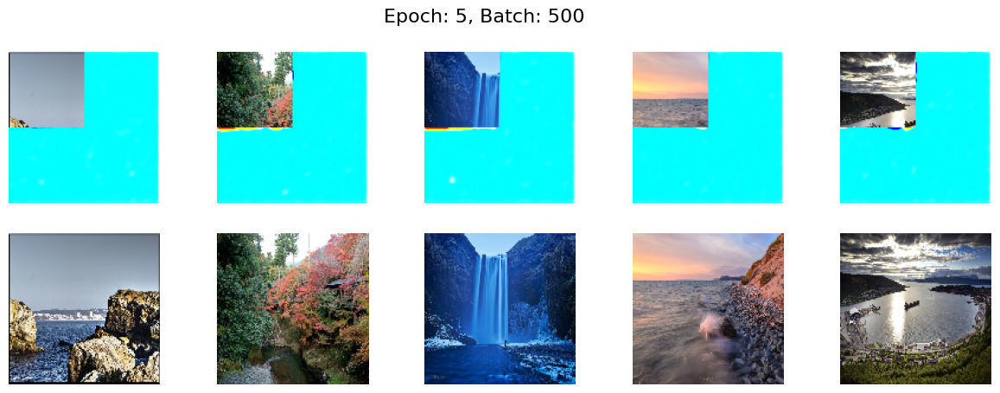

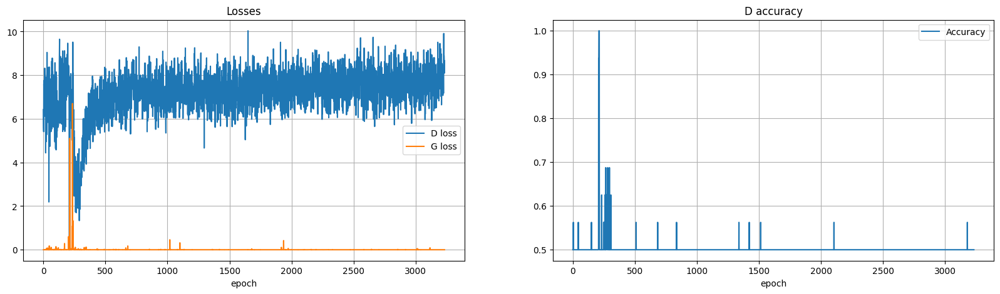

----EPOCH 6-----
0 [D loss: 7.8588,	 acc.: 50.00%]	[G loss: 0.0001]


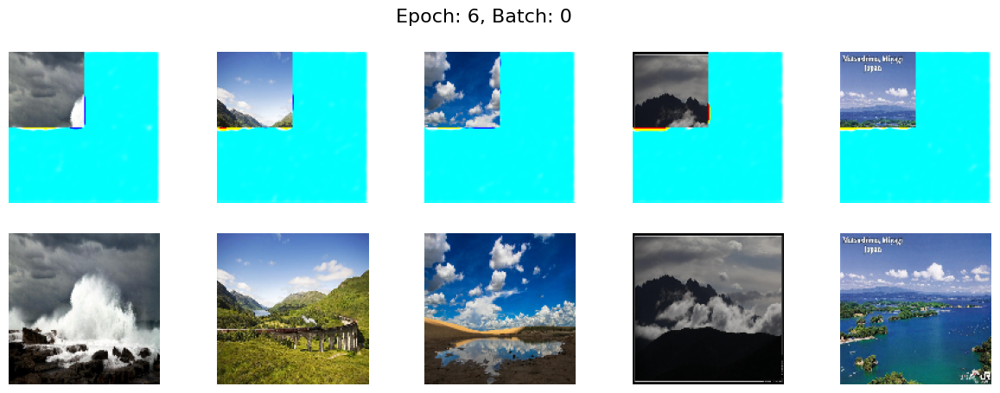

50 [D loss: 8.7524,	 acc.: 50.00%]	[G loss: 0.0001]
100 [D loss: 7.6204,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 8.7941,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 8.5458,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.6252,	 acc.: 50.00%]	[G loss: 0.0000]


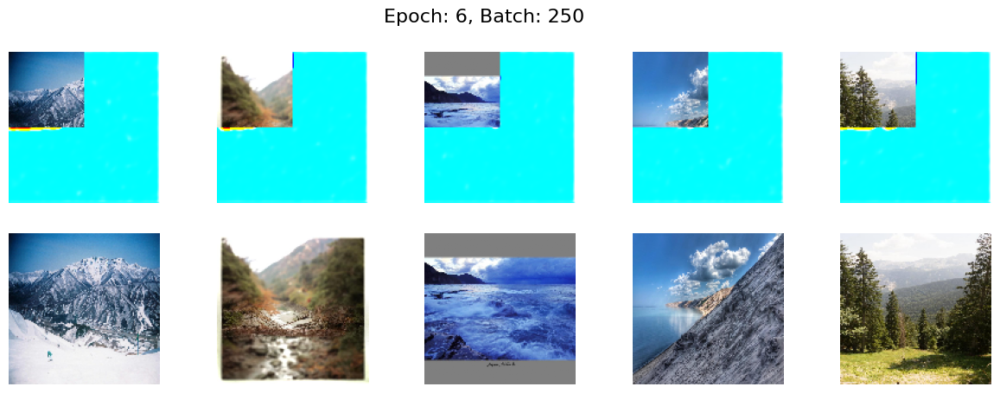

300 [D loss: 7.2263,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 8.0641,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 8.0062,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 9.1405,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 7.2855,	 acc.: 50.00%]	[G loss: 0.0001]


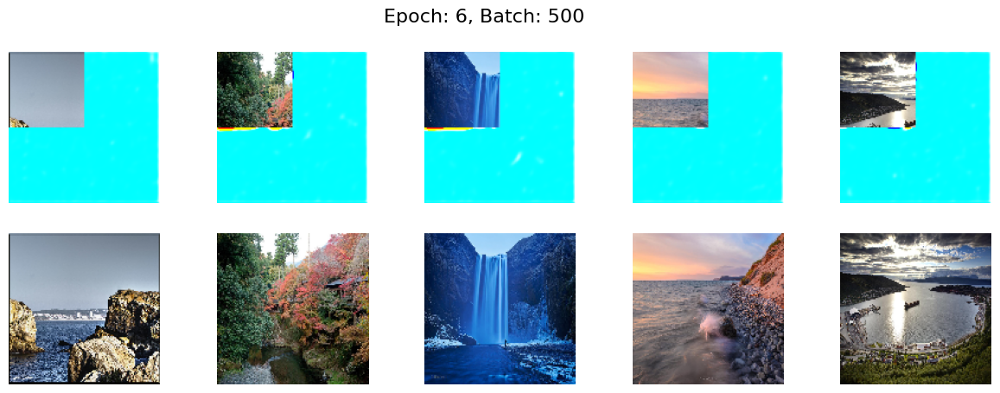

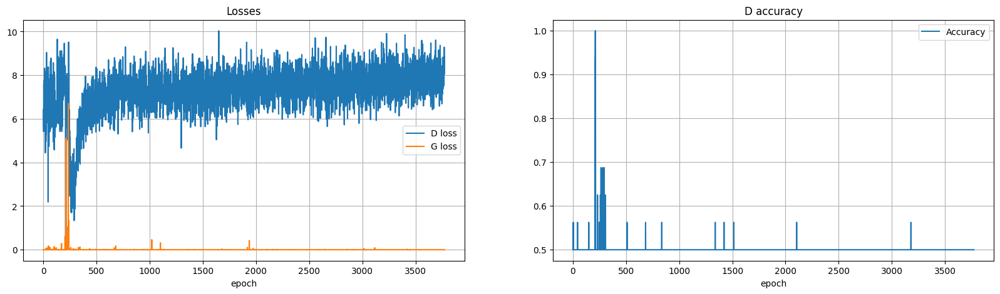

----EPOCH 7-----
0 [D loss: 8.0890,	 acc.: 50.00%]	[G loss: 0.0000]


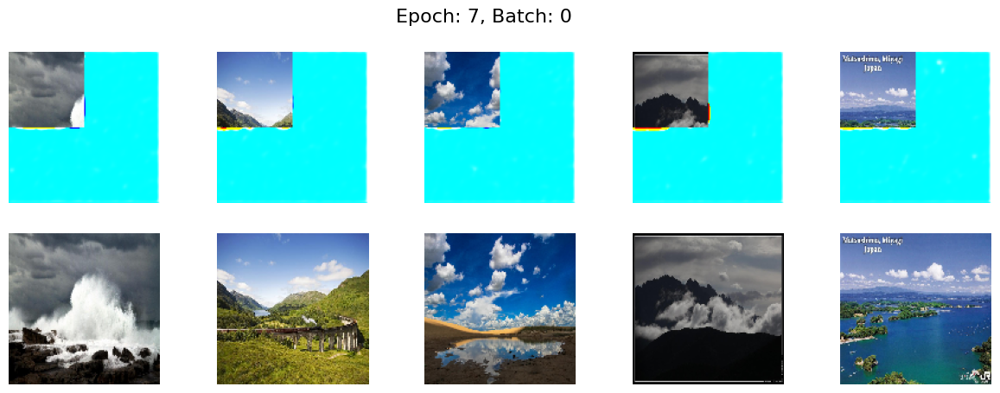

50 [D loss: 8.3504,	 acc.: 50.00%]	[G loss: 0.0000]
100 [D loss: 7.7511,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 7.6027,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 6.5605,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 8.4025,	 acc.: 50.00%]	[G loss: 0.0000]


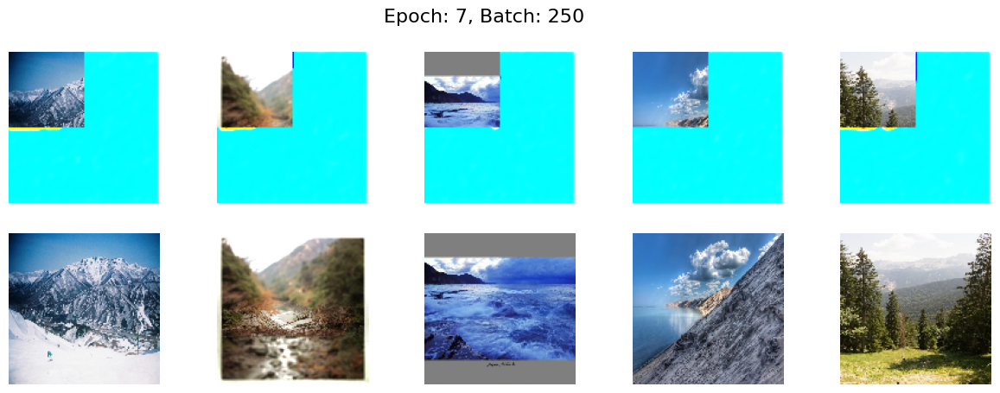

300 [D loss: 6.7166,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 7.4149,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 7.3653,	 acc.: 50.00%]	[G loss: 0.0001]
450 [D loss: 6.1197,	 acc.: 50.00%]	[G loss: 0.0001]
500 [D loss: 6.4683,	 acc.: 50.00%]	[G loss: 0.0001]


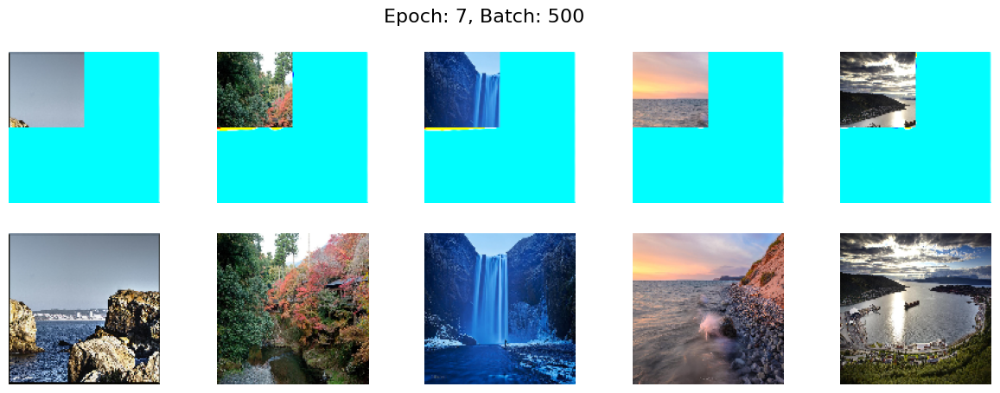

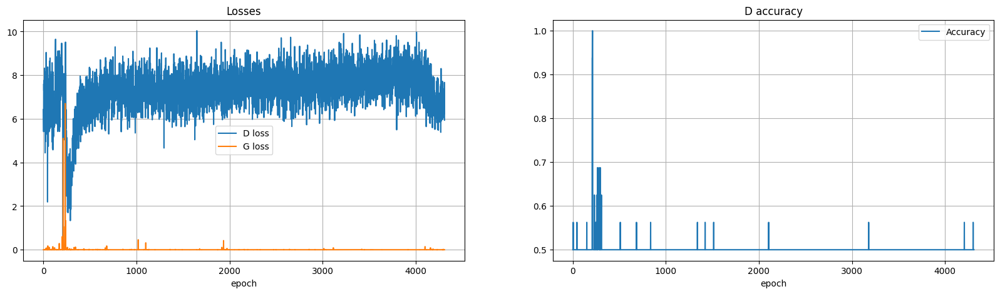

----EPOCH 8-----
0 [D loss: 6.7174,	 acc.: 50.00%]	[G loss: 0.0001]


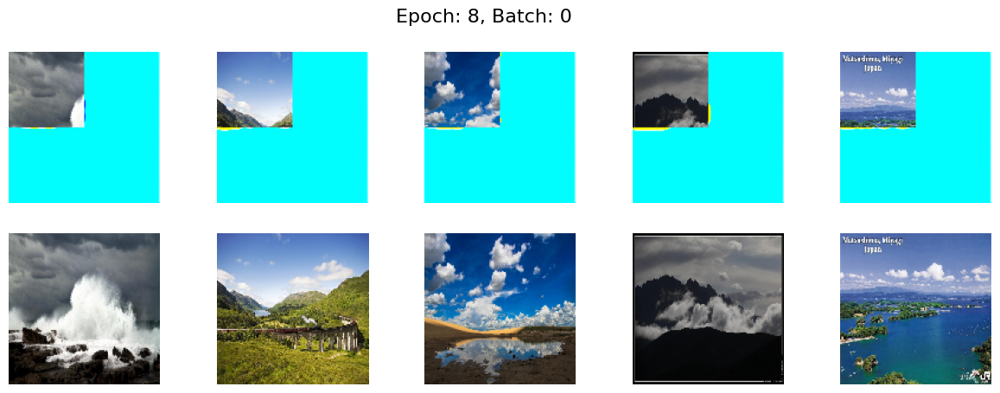

50 [D loss: 6.6305,	 acc.: 50.00%]	[G loss: 0.0001]
100 [D loss: 5.9667,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 7.8680,	 acc.: 50.00%]	[G loss: 0.0001]
200 [D loss: 5.3978,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.2555,	 acc.: 50.00%]	[G loss: 0.0000]


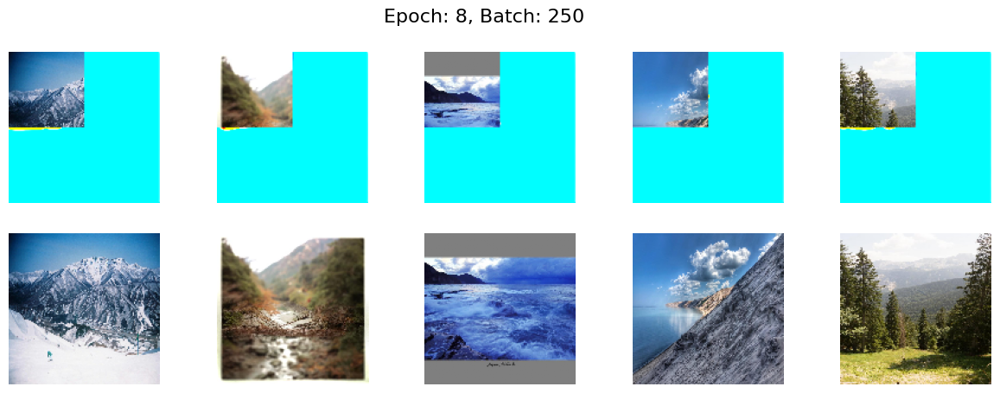

300 [D loss: 7.0494,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 7.0828,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 7.7691,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 7.1006,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 7.0175,	 acc.: 50.00%]	[G loss: 0.0000]


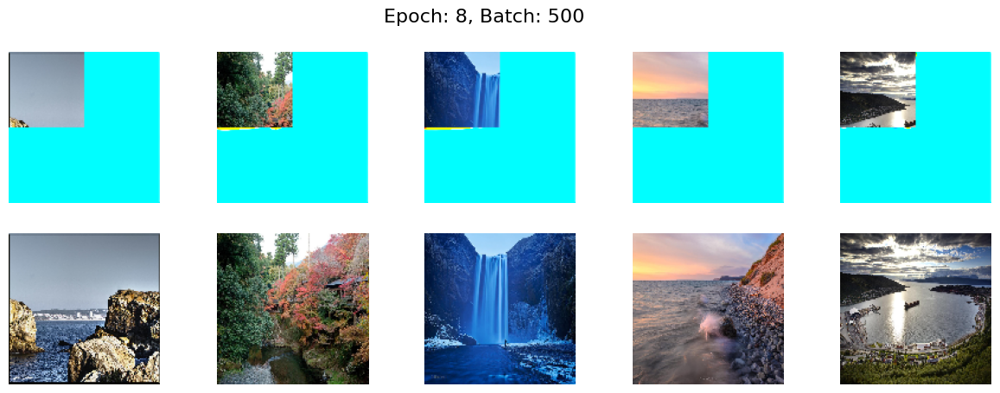

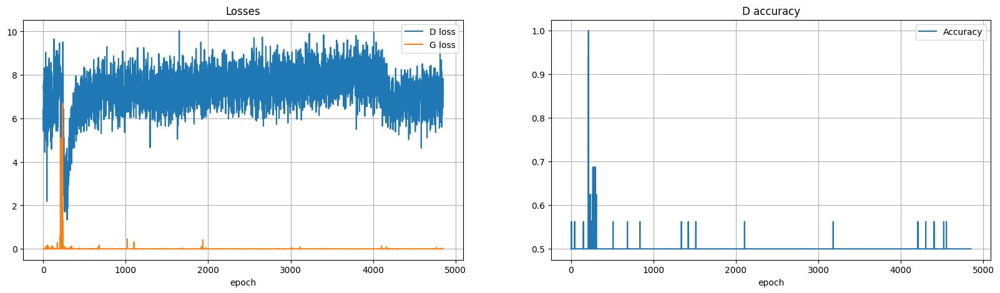

----EPOCH 9-----
0 [D loss: 6.4444,	 acc.: 50.00%]	[G loss: 0.0049]


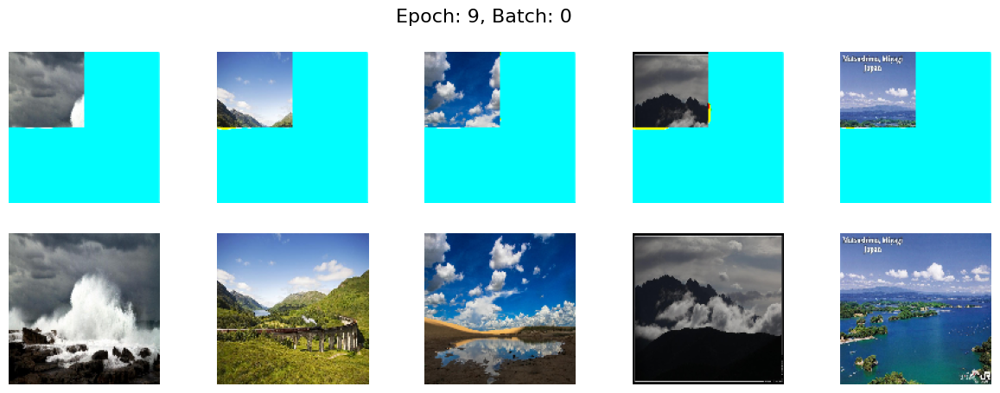

50 [D loss: 8.0821,	 acc.: 50.00%]	[G loss: 0.0001]
100 [D loss: 6.0356,	 acc.: 50.00%]	[G loss: 0.0000]
150 [D loss: 7.4944,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 6.8990,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 7.2575,	 acc.: 50.00%]	[G loss: 0.0000]


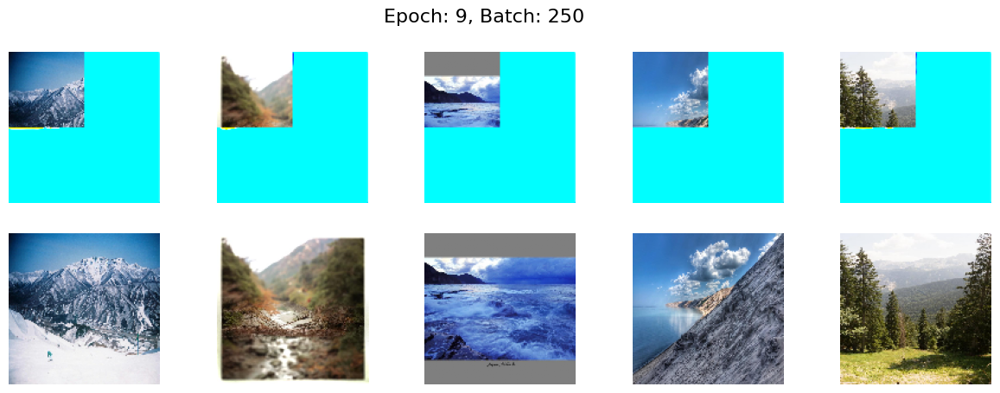

300 [D loss: 6.6637,	 acc.: 50.00%]	[G loss: 0.0000]
350 [D loss: 8.3062,	 acc.: 50.00%]	[G loss: 0.0000]
400 [D loss: 7.7984,	 acc.: 50.00%]	[G loss: 0.0000]
450 [D loss: 7.5033,	 acc.: 50.00%]	[G loss: 0.0000]
500 [D loss: 6.5990,	 acc.: 50.00%]	[G loss: 0.0004]


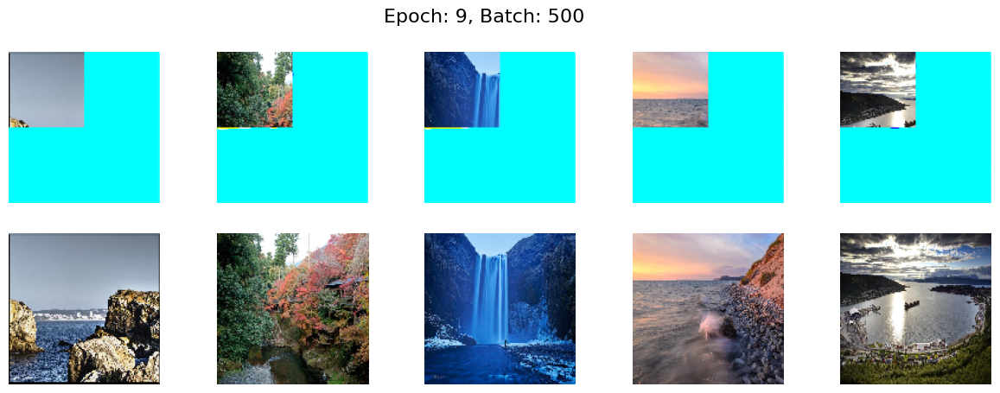

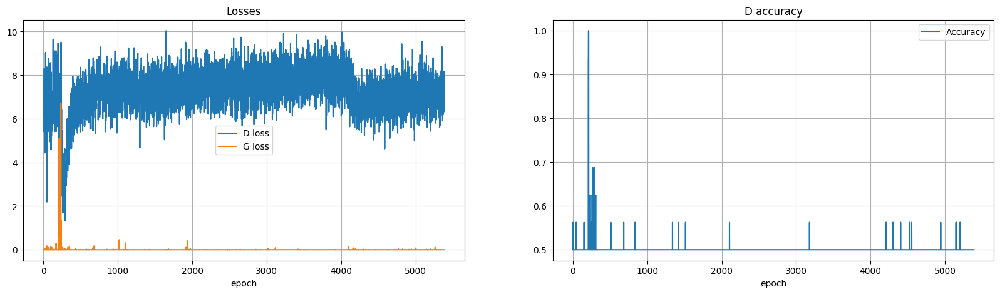

----EPOCH 10-----
0 [D loss: 7.2938,	 acc.: 50.00%]	[G loss: 0.0000]


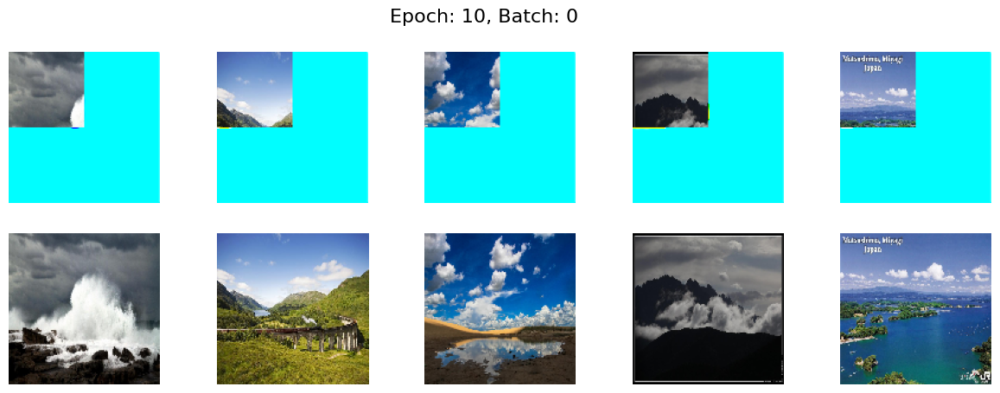

50 [D loss: 6.9982,	 acc.: 50.00%]	[G loss: 0.0010]
100 [D loss: 7.2562,	 acc.: 50.00%]	[G loss: 0.0015]
150 [D loss: 8.1243,	 acc.: 50.00%]	[G loss: 0.0000]
200 [D loss: 5.9010,	 acc.: 50.00%]	[G loss: 0.0000]
250 [D loss: 6.2016,	 acc.: 50.00%]	[G loss: 0.0000]


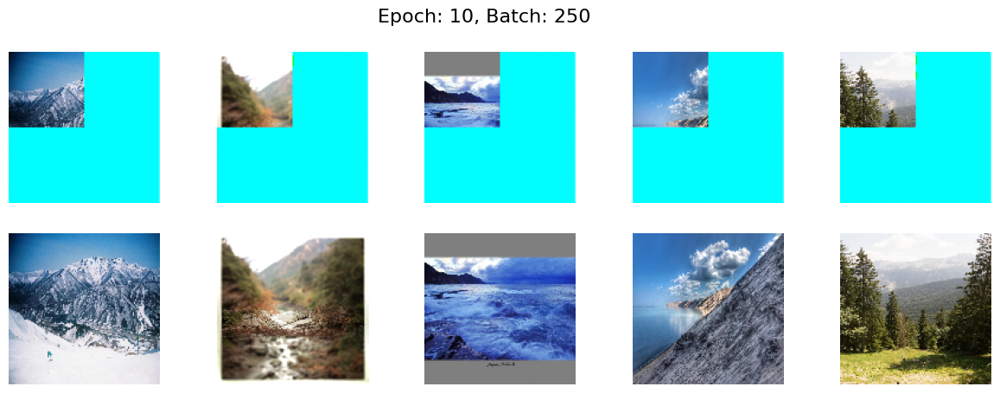

300 [D loss: 8.3680,	 acc.: 50.00%]	[G loss: 0.0000]


KeyboardInterrupt: ignored

In [ ]:
train(X_train_Reales, generatorRaul, discriminatorConvu4, combinedConvu4, epochs=10000, batch_size=8, sample_interval=10)

## Conclusión
Lamentablemente, el entrenamiento de la GAN definitiva, que utilizaba imágenes de dimensiones (128,128,3) como datos de entrada, no ha cumplido con las expectativas. Este resultado se debe a diversas limitaciones, como restricciones en el entorno, restricciones de tiempo y otros factores. La GAN no logra generar imágenes coherentes, y el discriminador no es capaz de distinguir las diferencias de manera efectiva. Además, hemos observado episodios de "gradient explosion", un fenómeno que impide que el modelo avance.

Este desafío subraya la importancia de considerar cuidadosamente los recursos y el tiempo disponibles al diseñar y entrenar modelos, así como la necesidad de explorar soluciones a problemas específicos, como el "gradient explosion". En futuros proyectos, podríamos explorar estrategias para mitigar este problema, como ajustes en la arquitectura de la red.


Ejemplo de ejecución:


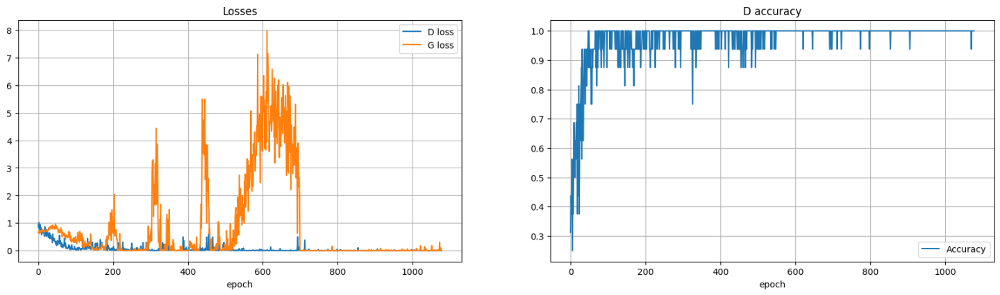